In [5]:
pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz

  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.0-py3-none-any.whl size=12019125 sha256=4efb6f09f5fa0f36929962883ff41a43071bd2c38538f5115046775d6befe121
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\64\69\41\6f820cf1d7488a0381a2059f66ec9f8f23116f7c67d18f3d8d
Successfully built en-core-web-sm
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install spacy

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install pyspellchecker

  Using cached pyspellchecker-0.5.4-py2.py3-none-any.whl (1.9 MB)
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\User\Miniconda3\python.exe -m pip install --upgrade pip' command.


In [31]:
import pandas as pd
import numpy as np
import string
import re
import os
from bs4 import BeautifulSoup as bs

In [8]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import MDS, TSNE

from sklearn.decomposition import TruncatedSVD, PCA
import matplotlib.pyplot as plt

from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import fcluster

import matplotlib.lines as mlines

In [9]:
import nltk
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer 

lemmatizer = WordNetLemmatizer() 
stemmer = PorterStemmer()

from spellchecker import SpellChecker
import spacy

In [45]:
import pickle

def save(obj, filename):
    with open(filename, 'wb') as output:  # Overwrites any existing file.
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)
    return 1

##-- Load obj from file    
def load(filename):
    with open(filename, 'rb') as input: 
        obj = pickle.load(input)
    return obj   

In [11]:
en = spacy.load('en_core_web_sm') # Dont use this since the length of some books are too long ( > 1,000,000)
en.max_length = 3000000
lemmatize = en.Defaults.create_lemmatizer()

In [6]:
spell = SpellChecker(distance=1)
def check_spelling(tokens, keep_wrong=False):
    if keep_wrong:
        length_original = len(tokens)
        tokens += [
            spell.correction(token) for token in tokens
            if not spell.correction(token) in [
                token for token in tokens
            ]
        ]
        return tokens, len(tokens) - length_original

    elif not keep_wrong:
        corrections = [
            (token, spell.correction(token)) for token in tokens
            if not token == spell.correction(token)
        ]
        for correction in corrections:
            tokens.remove(correction[0])
            tokens.append(correction[1])

        #return tokens, len(corrections)
        return len(corrections)

### Preprocessed data: Compare the performance of fixing the misspelled words by using only regex, lemmatization and stemming 

In [38]:
walk_dir = "D:\\Project\\DS\\Data Mining\\cw2\\gap-html\\gap-html\\"
books = pd.DataFrame(columns=['book_name', 'contents'])

print('walk_dir = ' + walk_dir)
print('walk_dir (absolute) = ' + os.path.abspath(walk_dir))

book_id = 1
for root, subdirs, files in os.walk(walk_dir):
    path, book_name = os.path.split(root)
    if len(files) == 24:continue
    all_text = []
    split_text = []
    print("Scrapt {}".format(book_name))
    for filename in files:
        # os.path.join => join str with //
        file_path = os.path.join(root, filename)
        soup = bs(open(file_path, encoding="utf-8"), "html.parser") #read file
        ocr_tags = soup.select(".ocr_cinfo") #read tags
        text_list = [tag.get_text() for tag in ocr_tags] #extract each text as a single string 
        text = ' '.join(text_list)
        if text.strip() != '':
            split_text.append(text)
    all_text.append(split_text)

    # print(book_name)
    # write all pages for processed book to dataframe
    books.loc[book_id] = [book_name, all_text]
    print("Save book: "+book_name)
    book_id+=1

walk_dir = D:\Project\DS\Data Mining\cw2\gap-html\gap-html\
walk_dir (absolute) = D:\Project\DS\Data Mining\cw2\gap-html\gap-html
Scrapt 
Save book: 
Scrapt gap_-C0BAAAAQAAJ
Save book: gap_-C0BAAAAQAAJ
Scrapt gap_2X5KAAAAYAAJ
Save book: gap_2X5KAAAAYAAJ
Scrapt gap_9ksIAAAAQAAJ
Save book: gap_9ksIAAAAQAAJ
Scrapt gap_aLcWAAAAQAAJ
Save book: gap_aLcWAAAAQAAJ
Scrapt gap_Bdw_AAAAYAAJ
Save book: gap_Bdw_AAAAYAAJ
Scrapt gap_CnnUAAAAMAAJ
Save book: gap_CnnUAAAAMAAJ
Scrapt gap_CSEUAAAAYAAJ
Save book: gap_CSEUAAAAYAAJ
Scrapt gap_DhULAAAAYAAJ
Save book: gap_DhULAAAAYAAJ
Scrapt gap_dIkBAAAAQAAJ
Save book: gap_dIkBAAAAQAAJ
Scrapt gap_DqQNAAAAYAAJ
Save book: gap_DqQNAAAAYAAJ
Scrapt gap_fnAMAAAAYAAJ
Save book: gap_fnAMAAAAYAAJ
Scrapt gap_GIt0HMhqjRgC
Save book: gap_GIt0HMhqjRgC
Scrapt gap_IlUMAQAAMAAJ
Save book: gap_IlUMAQAAMAAJ
Scrapt gap_MEoWAAAAYAAJ
Save book: gap_MEoWAAAAYAAJ
Scrapt gap_m_6B1DkImIoC
Save book: gap_m_6B1DkImIoC
Scrapt gap_ogsNAAAAIAAJ
Save book: gap_ogsNAAAAIAAJ
Scrapt gap_pX5KAAA

In [46]:
save(books, 'books_0819.pkl') 

1

In [18]:
raw_data = load("test.pkl") # THIS IS THE DATA SPARSED FROM HTML

In [21]:
raw_data.contents[2]

'800020427L   ►   ZOI5 DICTIONARY GREEK AND ROMAN GEOGRAPHY.   ns   DICTIONARY GREEK AND ROMAN GEOGRAPHY. I\'nuted hjr Aroma woom & Co , Nrw-Urrvt-SquArr. DICTIONARY GREEK AND ROMAN GEOGRAPHY. EDITED BY WILLIAM SMITH, LL.D. IN TWO VOLUMES. VOL II. IABAD1US —ZYMETHUS.     ILLUSTRATED BY NUMEROUS ENGRAVINGS ON WOOD LONDON: WALTON AND MABERLY, UPPER GOWER STREET, AND IVT LAKE, PATERNOSTER ROW; JOHN MURRAY, ALBEMARLE STREET. M.DCCC.LVII. LIST OF WRITERS IN VOL. II. G. F- B. George Ferguson Bowen, M. A. Late Fellow of Brasenose College, Oxford. E. EL B. Edward Herbert Bunbury, M. A. Late Fellow of Trinity College, Cambridge. G. B. George Butler, M. A. Late Fellow of Exeter College, Oxford. W. B. D. William Bodhah Donne. T.RD. Thomas H. Dyer. J. S. H. J. S. Howson, M. A. Principal of the Collegiate Institution, Liverpool. E. B. J. Edward Boucher James, M. A. Fellow and Tutor of Queen\'s College, Oxford. B. G. L» Robert Gordon Latham, M. A. Late Fellow of King\'s College, Cambridge. G. L. Geo

In [500]:
data_lemmatization = load("books_lemmatization.pkl")
data_lemmatization = data_lemmatization['contents'].tolist()

In [12]:
data = pd.read_pickle("books.pkl")
data = data['contents'].tolist()

In [22]:
for i in range(1, len(data)):
    n_total_word = len(data[i])
    n_unique_word = len(set(data[i]))
    print("total word number is {} and unique word is {}".format(n_total_word, n_unique_word))

total word number is 922579 and unique word is 143826
total word number is 37776 and unique word is 8740
total word number is 66889 and unique word is 11673
total word number is 140007 and unique word is 19183
total word number is 97051 and unique word is 14438
total word number is 96803 and unique word is 10673
total word number is 208613 and unique word is 28248
total word number is 71788 and unique word is 16330
total word number is 102797 and unique word is 15128
total word number is 54914 and unique word is 8740
total word number is 87548 and unique word is 13041
total word number is 88611 and unique word is 14254
total word number is 83691 and unique word is 12881
total word number is 36996 and unique word is 8356
total word number is 85272 and unique word is 13161
total word number is 104705 and unique word is 12143
total word number is 40550 and unique word is 9328
total word number is 71216 and unique word is 9465
total word number is 226031 and unique word is 18422
total word

In [16]:
data[i]

['iiiiiii',
 'hx',
 'iht',
 'b',
 'arbart',
 'college',
 'htbrarg',
 'parkman',
 'collection',
 'bequeathed',
 'francis',
 'f',
 'ar',
 'k',
 'n',
 'h',
 'c',
 'received',
 'january',
 'rflgt',
 'pa',
 'ssa',
 'works',
 'flavius',
 'josephus',
 'learned',
 'authentic',
 'jewish',
 'historian',
 'celebrated',
 'warrior',
 'vol',
 'iii',
 'works',
 'fx',
 'avius',
 'josephus',
 'learned',
 'authentic',
 'jewish',
 'historian',
 'celebrated',
 'warrior',
 'four',
 'volumes',
 'added',
 'three',
 'dissertations',
 'concerning',
 'jesus',
 'christ',
 'john',
 'baptist',
 'james',
 'thb',
 'god',
 'command',
 'abraham',
 'bv',
 'index',
 'whole',
 'copperplates',
 'translated',
 'william',
 'whiston',
 'professor',
 'mathematics',
 'university',
 'cambridge',
 'vol',
 'iii',
 'london',
 'printed',
 'lackington',
 'allen',
 'co',
 'longman',
 'hurst',
 'rees',
 'orme',
 'vcrnor',
 'hood',
 'sharpc',
 'cuthell',
 'martin',
 'james',
 'nunn',
 'samuel',
 'bagster',
 'slo',
 'harvard',
 'oollege

In [78]:
total_words_lemmatization = 0
for text in data_lemmatization:
    total_words_lemmatization+=len(text)
total_words_lemmatization

3147401

In [82]:
def check_spell(data, data_type):

    for i in range(5,15):
        print('Process the {}th row'.format(i))
        if not data[i]:
            continue
        len_correction = check_spelling(data[i])
        n = (len_correction/len(data[i]))*100
        print('The percentage of correction is {}'.format(n))

In [83]:
check_spell(data_stemmer, 'Stemming')

Process the 5th row
The percentage of correction is 0.0
Process the 6th row
The percentage of correction is 0.0
Process the 7th row
The percentage of correction is 28.44761144989656
Process the 8th row
The percentage of correction is 26.333192812351797
Process the 9th row
The percentage of correction is 28.98465117547096
Process the 10th row
The percentage of correction is 27.347957665806078
Process the 11th row
The percentage of correction is 27.720778803521323
Process the 12th row
The percentage of correction is 29.659952944155478
Process the 13th row
The percentage of correction is 31.655695637621335
Process the 14th row
The percentage of correction is 27.543736175346872


In [84]:
check_spell(data_lemmatization, 'lemmatization')

Process the 5th row
The percentage of correction is 23.448081264108353
Process the 6th row
The percentage of correction is 3.692353763226193
Process the 7th row
The percentage of correction is 5.872347583912376
Process the 8th row
The percentage of correction is 7.850467289719626
Process the 9th row
The percentage of correction is 4.3381713724156175
Process the 10th row
The percentage of correction is 4.477213228615697
Process the 11th row
The percentage of correction is 4.63032532268736
Process the 12th row
The percentage of correction is 4.6912524262262725
Process the 13th row
The percentage of correction is 4.782416354280659
Process the 14th row
The percentage of correction is 5.003929787791459


In [661]:
def _tokenizer(text):
    ''' Placeholder function for already tokenized inputs '''
    return text


def get_tfidf_model(corpus):
    vectorizer = TfidfVectorizer(tokenizer=_tokenizer, lowercase=False)
    corpus_matrix = vectorizer.fit_transform(corpus)
    feature_names = vectorizer.get_feature_names()

    return vectorizer, corpus_matrix, feature_names

In [662]:
def tokenize_and_stem(text):
    #initiate tokenizer and capture only English letters
    tokenizer = RegexpTokenizer(r'[a-zA-Z]+')
    stemmer = PorterStemmer()
    #lower and tokenize 
    tokens = tokenizer.tokenize(text.lower())
    stems = [stemmer.stem(t) for t in tokens]
    return stems

In [663]:
def tfidf(text_list,min=1,max=1.0):
    tfidf_vectorizer = TfidfVectorizer(
                            max_df=max, max_features=None,
                            min_df=min, stop_words='english',
                            use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))
    tfidf_books = tfidf_vectorizer.fit_transform(text_list) #fit the vectorizer to synopses
    return tfidf_books

### Test the lemmatize data by using "text" file

In [635]:
doc_lemma = load('books_lemmatization.pkl')

In [636]:
doc_lemma

,book_name,contents
0,,[]
1,gap_-C0BAAAAQAAJ,"[l, zoi, dictionary, greek, roman, geography, ..."
2,gap_2X5KAAAAYAAJ,"[creslorecl, arant, cartwright, foundation, pr..."
3,gap_9ksIAAAAQAAJ,"[w, j, history, peloponnesian, war, translated..."
4,gap_aLcWAAAAQAAJ,"[history, decline, fall, roman, empire, edward..."
5,gap_Bdw_AAAAYAAJ,"[university, virginia, library, dg, l, b, v, a..."
6,gap_CnnUAAAAMAAJ,"[univcr, general, library, system, university,..."
7,gap_CSEUAAAAYAAJ,"[k, e, history, op, tuk, decline, fall, roman,..."
8,gap_DhULAAAAYAAJ,"[th, description, ok, greece, sr, p, au, descr..."
9,gap_dIkBAAAAQAAJ,"[lral, bmbbib, l, j, u, f, history, rome, theo..."


In [637]:
doc_lemma = doc_lemma['contents'][1:]

In [ ]:
vec, matrix, feat_names = get_tfidf_model(doc_lemma)

In [593]:
tf_vec_lemma = 1-cosine_similarity(matrix)
tf_vec_lemma.shape

(24, 24)

### The vectors processed by tf-idf and doc2vec

In [594]:
# TF-IDF tf_vec

In [597]:
for i in range(len(tf_vec_lemma)):
    tf_vec_lemma[i] = np.clip(tf_vec_lemma[i], 0, 1.0)
tf_vec_lemma

array([[2.88624680e-12, 9.75236453e-01, 9.72700016e-01, 9.59649129e-01,
        9.78307668e-01, 9.71347628e-01, 9.58374575e-01, 9.65188391e-01,
        9.57566543e-01, 9.71563203e-01, 9.68296071e-01, 9.65662023e-01,
        9.68943633e-01, 9.75574227e-01, 9.70805283e-01, 9.66981754e-01,
        9.74081429e-01, 9.70666156e-01, 9.62451663e-01, 9.76473577e-01,
        9.62914600e-01, 9.69591514e-01, 9.64404396e-01, 9.72514044e-01],
       [9.75236453e-01, 0.00000000e+00, 9.65322095e-01, 9.56165736e-01,
        9.71485260e-01, 9.66942463e-01, 9.61820444e-01, 9.75704589e-01,
        9.63611421e-01, 9.57967650e-01, 9.62386146e-01, 9.58089479e-01,
        9.57387233e-01, 9.36147094e-01, 9.56821979e-01, 9.65192155e-01,
        9.30664656e-01, 9.58126040e-01, 9.66111359e-01, 9.74750692e-01,
        9.60386123e-01, 9.65573500e-01, 9.63184427e-01, 9.65398473e-01],
       [9.72700016e-01, 9.65322095e-01, 0.00000000e+00, 9.66695773e-01,
        9.72109789e-01, 9.63106446e-01, 9.68700577e-01, 9.6787

In [799]:
doc_vec_stem = load('doc2vec_stemm_300.pkl')
doc_vec_stem = np.array(doc_vec_stem)
type(doc_vec_stem)

numpy.ndarray

In [599]:
doc_vec = load('doc2vec_lemma_300.pkl')
doc_vec = np.array(doc_vec)
type(doc_vec)

numpy.ndarray

In [600]:
doc_vec

array([[11.266948  ,  3.5104978 , -0.18465298, ..., -0.11218591,
         6.5069914 ,  6.0117292 ],
       [12.7898855 , -0.7090186 , -0.96777   , ...,  0.4589196 ,
         4.27373   ,  1.4923167 ],
       [10.733465  ,  2.021575  , -1.7383058 , ..., -0.24834967,
         7.806241  ,  1.4360753 ],
       ...,
       [14.588247  ,  2.9417944 ,  1.8207116 , ...,  0.62760943,
         7.466556  ,  5.0536466 ],
       [13.533315  ,  3.225792  , -1.2970202 , ...,  0.27444845,
         5.3319526 ,  2.273925  ],
       [ 7.7399435 ,  0.74739647, -0.57730526, ...,  1.9271233 ,
         4.5149755 ,  2.5765984 ]], dtype=float32)

### Dimension reduction

### 思考問題: 如何評估降維後投影到N維空間中，破壞原資料結構的程度多寡?
1. 將數據降至2維，使用kmeans視覺化
2. Tutorial : 淺談降維方法中的 PCA 與 t-SNE https://medium.com/d-d-mag/%E6%B7%BA%E8%AB%87%E5%85%A9%E7%A8%AE%E9%99%8D%E7%B6%AD%E6%96%B9%E6%B3%95-pca-%E8%88%87-t-sne-d4254916925b

In [601]:
# tSNE

def tsne(featureVector, n, m = "precomputed"):
    ts = TSNE(n_components=n, random_state=1, metric=m)
    pos = ts.fit_transform(featureVector)  # shape (n_components, n_samples)
    return pos

In [602]:
# TRUCATED SVD

def svd(featureVector, n):
    sv = TruncatedSVD(n_components=n, random_state=1)
    pos = sv.fit_transform(featureVector)  
    return pos

In [603]:
# MDS CLUSTERING for TF-IDF

def mds(featureVector, n):
    mds = MDS(n_components=n, random_state=1,dissimilarity="precomputed")
    pos = mds.fit_transform(featureVector)
    return pos

#### Plot TF-IDF + various dimention reduction 

In [604]:
#TF-IDF + tSNE ( Five dimension)

In [605]:
tf_lemma_tsne = tsne(tf_vec_lemma, 2)
tf_lemma_tsne.shape

(24, 2)

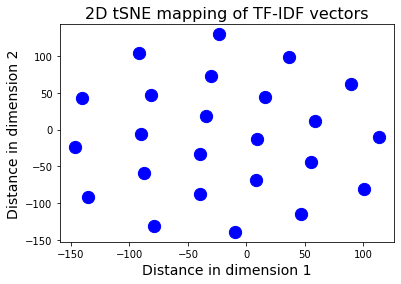

<Figure size 432x288 with 0 Axes>

In [606]:
plt.figure(figsize=(6, 4))
plt.scatter(tf_lemma_tsne[:,0], tf_lemma_tsne[:,1], color='b', s=150)
plt.xlabel('Distance in dimension 1', fontsize =14)
plt.ylabel('Distance in dimension 2', fontsize =14)
plt.title('2D tSNE mapping of TF-IDF vectors', fontsize =16)

plt.show()
plt.savefig('tSNE mapping_TF-IDF vectors')

In [607]:
#TF-IDF + SVD
tf_lemma_svd = svd(tf_vec_lemma, 2)

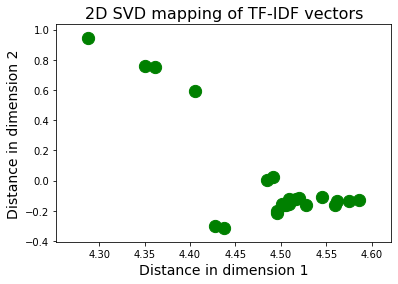

<Figure size 432x288 with 0 Axes>

In [608]:
plt.figure(figsize=(6, 4))
plt.scatter(tf_lemma_svd[:,0], tf_lemma_svd[:,1], color='g', s = 150)
plt.xlabel('Distance in dimension 1', fontsize =14)
plt.ylabel('Distance in dimension 2', fontsize =14)
plt.title('2D SVD mapping of TF-IDF vectors', fontsize =16)

plt.show()
plt.savefig('SVD mapping_TF-IDF vectors')

In [609]:
tf_stem_svd = svd(tf_vec_stem, 2)

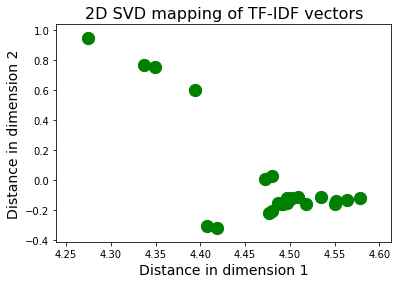

In [610]:
plt.figure(figsize=(6, 4))
plt.scatter(tf_stem_svd[:,0], tf_stem_svd[:,1], color='g', s = 150)
plt.xlabel('Distance in dimension 1', fontsize =14)
plt.ylabel('Distance in dimension 2', fontsize =14)
plt.title('2D SVD mapping of TF-IDF vectors', fontsize =16)

plt.show()
#plt.savefig('SVD mapping_TF-IDF vectors')

In [670]:
tf_mds_stem = mds(tf_vec_stem, 2) 

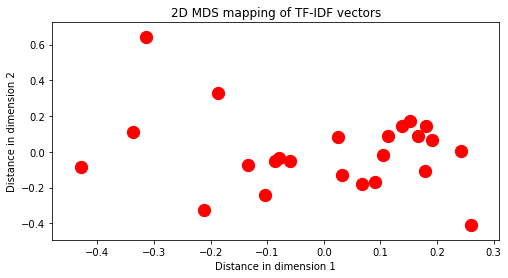

In [671]:
plt.figure(figsize=(8, 4))
plt.scatter(tf_mds_stem[:,0], tf_mds_stem[:,1], color='r', s = 150)
plt.xlabel('Distance in dimension 1')
plt.ylabel('Distance in dimension 2')
plt.title('2D MDS mapping of TF-IDF vectors')


plt.show()
#plt.savefig('mds mapping_TF-IDF vectors')

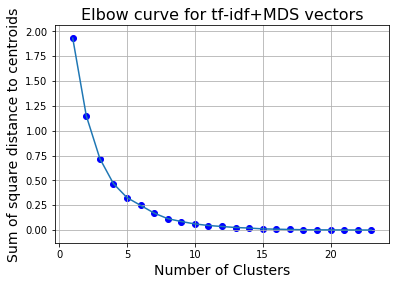

In [672]:
KMEANS(tf_mds_stem, 'tf-idf+MDS') 

In [673]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(tf_mds_stem)
labels = kmeans.predict(tf_mds_stem)
labels

array([2, 1, 3, 1, 0, 5, 1, 4, 0, 0, 3, 1, 1, 1, 0, 5, 1, 0, 5, 4, 1, 2,
       1, 5])

Ploting..


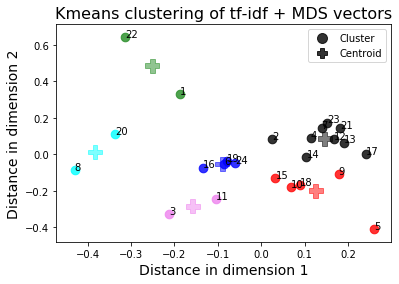

<Figure size 432x288 with 0 Axes>

In [674]:
# Kmeans clustering for TF-IDF stemming vectors

centers = kmeans.cluster_centers_

print ("Ploting..")
color=['r','k','forestgreen','violet','aqua', 'b']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(tf_mds_stem)):
    x = tf_mds_stem[:,0][i]
    y = tf_mds_stem[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)

cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')
plt.legend(handles=[cir, cross])

ax.set_xlabel('Distance in dimension 1', fontsize = 14)
ax.set_ylabel('Distance in dimension 2', fontsize = 14)
plt.title('Kmeans clustering of tf-idf + MDS vectors', fontsize = 16)
plt.show()
plt.savefig('kmenas_MDS_tf-idf')

Text(0.5, 1.0, 'Silhouette Score for 2d TF-IDF(Stem) + MDS')

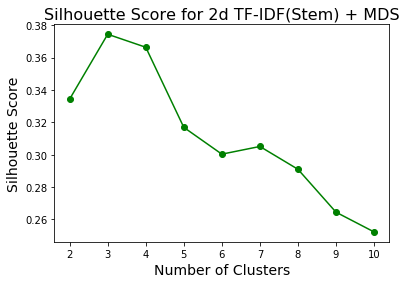

In [616]:
silhouette_avg = []
for i in range(2,11):
    kmeans_fit = KMeans(n_clusters = i).fit(tf_mds_stem)
    silhouette_avg.append(silhouette_score(tf_mds_stem, kmeans_fit.labels_))
plt.plot(range(2,11), silhouette_avg, color = 'g', marker = 'o')
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Silhouette Score', fontsize = 14)
plt.title('Silhouette Score for 2d TF-IDF(Stem) + MDS', fontsize = 16)

#plt.savefig('Silhouette Score_TF-IDF_MDS')

Ploting..


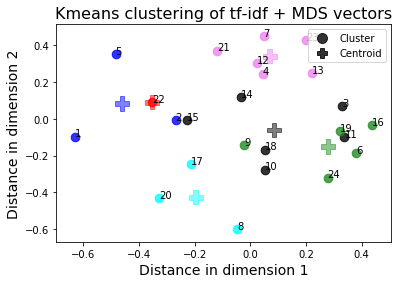

<Figure size 432x288 with 0 Axes>

In [548]:
# Kmeans clustering for TF-IDF stemming vectors

kmeans = KMeans(n_clusters=6)
kmeans.fit(tf_mds_lemma)
labels = kmeans.predict(tf_mds_lemma)

centers = kmeans.cluster_centers_

print ("Ploting..")
color=['r','k','forestgreen','violet','aqua', 'b']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(tf_mds_lemma)):
    x = tf_mds_lemma[:,0][i]
    y = tf_mds_lemma[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)

cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')
plt.legend(handles=[cir, cross])

ax.set_xlabel('Distance in dimension 1', fontsize = 14)
ax.set_ylabel('Distance in dimension 2', fontsize = 14)
plt.title('Kmeans clustering of tf-idf + MDS vectors', fontsize = 16)
plt.show()
plt.savefig('kmenas_MDS_tf-idf')

In [760]:
tf_mds_lemma = mds(tf_vec_lemma, 2) 

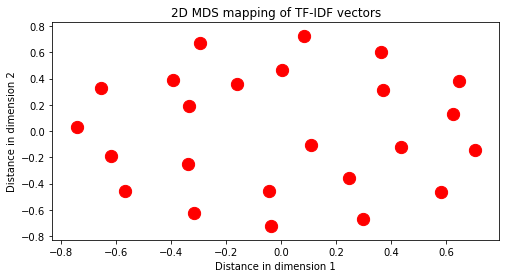

<Figure size 432x288 with 0 Axes>

In [761]:
plt.figure(figsize=(8, 4))
plt.scatter(tf_mds_lemma[:,0], tf_mds_lemma[:,1], color='r', s = 150)
plt.xlabel('Distance in dimension 1')
plt.ylabel('Distance in dimension 2')
plt.title('2D MDS mapping of TF-IDF vectors')


plt.show()
plt.savefig('mds mapping_TF-IDF vectors')

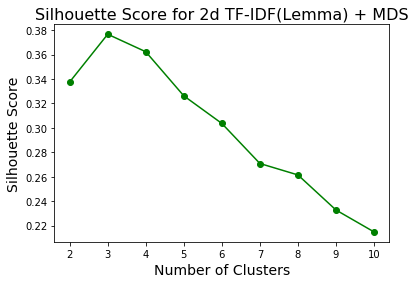

In [762]:
silhouette_avg = []
for i in range(2,11):
    kmeans_fit = KMeans(n_clusters = i).fit(tf_mds_lemma)
    silhouette_avg.append(silhouette_score(tf_mds_lemma, kmeans_fit.labels_))
plt.plot(range(2,11), silhouette_avg, color = 'g', marker = 'o')
plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Silhouette Score', fontsize = 14)
plt.title('Silhouette Score for 2d TF-IDF(Lemma) + MDS', fontsize = 16)

plt.savefig('Silhouette Score_TF-IDF_MDS')

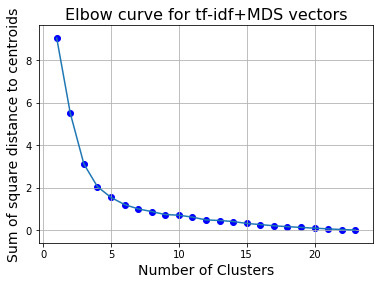

In [763]:
KMEANS(tf_mds_lemma, 'tf-idf+MDS') 

In [764]:
kmeans = KMeans(n_clusters=8)
kmeans.fit(tf_mds_lemma)
labels = kmeans.predict(tf_mds_lemma)
labels

array([3, 0, 7, 4, 1, 1, 4, 2, 3, 2, 7, 4, 6, 5, 6, 2, 6, 3, 1, 6, 4, 0,
       5, 7])

In [765]:
centers = kmeans.cluster_centers_

Ploting..


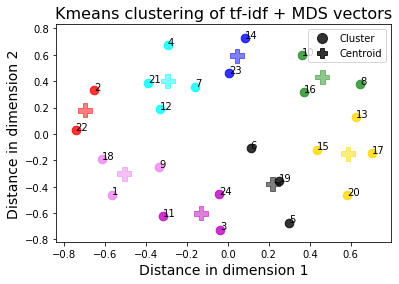

<Figure size 432x288 with 0 Axes>

In [766]:
print ("Ploting..")
color=['r','k','forestgreen','violet','aqua', 'b','gold','m']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(tf_mds_lemma)):
    x = tf_mds_lemma[:,0][i]
    y = tf_mds_lemma[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)

cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')
plt.legend(handles=[cir, cross])

ax.set_xlabel('Distance in dimension 1', fontsize = 14)
ax.set_ylabel('Distance in dimension 2', fontsize = 14)
plt.title('Kmeans clustering of tf-idf + MDS vectors', fontsize = 16)
plt.show()
plt.savefig('kmenas_MDS_tf-idf')

In [215]:
doc_vec.shape # The dimension of doc2vec vector

(24, 300)

In [772]:
#doc_vec 24x300 with PCA to 2 D
pca = PCA(n_components=2)

#將資料轉成兩個主成份
pca.fit(doc_vec)
doc_pca_300 = pca.transform(doc_vec)

#原本有30種維度

doc_pca_300.shape

(24, 2)

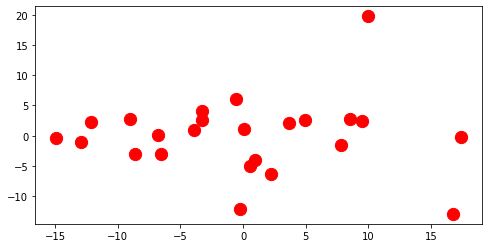

In [773]:
plt.figure(figsize=(8, 4))
plt.scatter(doc_pca_300[:,0], doc_pca_300[:,1], color='r', s=150)
plt.show()

In [774]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(doc_pca_300)
labels = kmeans.predict(doc_pca_300)

Ploting..


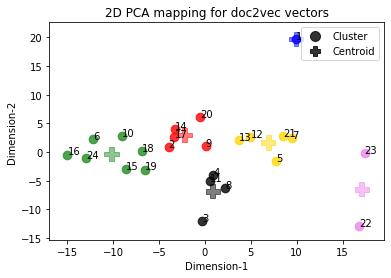

<Figure size 432x288 with 0 Axes>

In [775]:
print ("Ploting..")
color=['r','k','forestgreen','violet','b','gold']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']

centers = kmeans.cluster_centers_
#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_pca_300)):
    x = doc_pca_300[:,0][i]
    y = doc_pca_300[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)

cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')
plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1')
ax.set_ylabel('Dimension-2')
plt.title('2D PCA mapping for doc2vec vectors')
plt.show()
plt.savefig('PCA_doc2vec')

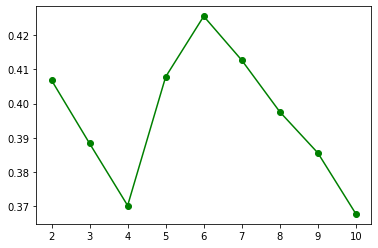

In [776]:
silhouette_avg = []
for i in range(2,11):
    kmeans_fit = KMeans(n_clusters = i).fit(doc_pca_300)
    silhouette_avg.append(silhouette_score(doc_pca_300, kmeans_fit.labels_))
plt.plot(range(2,11), silhouette_avg, color = 'g', marker = 'o')



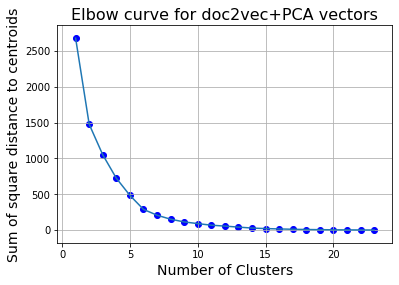

In [777]:
KMEANS(doc_pca_300, 'doc2vec+PCA') 

In [779]:
from matplotlib.colors import ListedColormap
color=['r','g','b','m','y','k','b']
cmp = ListedColormap(color)

Ploting..


NameError: name 'doc_pca' is not defined

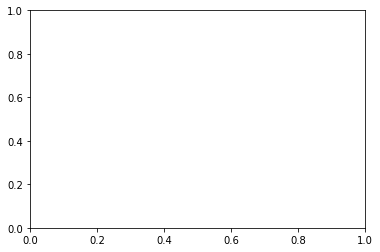

In [780]:
print ("Ploting..")
color=['r','k','forestgreen','violet','aqua','b','gold']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_pca)):
    x = doc_pca[:,0][i]
    y = doc_pca[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)

cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')
plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1')
ax.set_ylabel('Dimension-2')
plt.title('2D PCA mapping for doc2vec vectors')
plt.show()
plt.savefig('PCA_doc2vec')

In [781]:
doc_svd_300 = svd(doc_vec, 3)

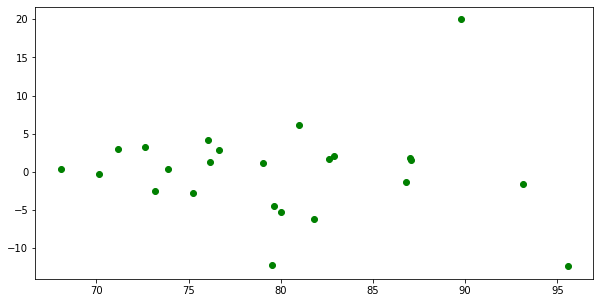

In [691]:
#doc2vec 300d+ SVD -->3 d

plt.figure(figsize=(10, 5))
plt.scatter(doc_svd_300[:,0], doc_svd_300[:,1], color='g')
plt.show()

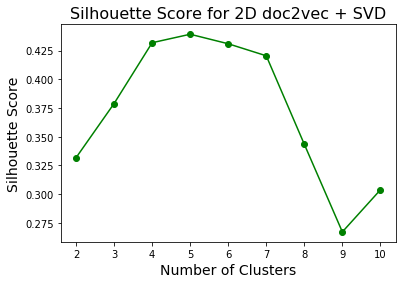

In [692]:
silhouette_avg = []
for i in range(2,11):
    kmeans_fit = KMeans(n_clusters = i).fit(doc_svd_300)
    silhouette_avg.append(silhouette_score(doc_svd_300, kmeans_fit.labels_))
plt.plot(range(2,11), silhouette_avg, color = 'g', marker = 'o')

plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Silhouette Score', fontsize = 14)
plt.title('Silhouette Score for 2D doc2vec + SVD', fontsize = 16)

plt.savefig('Silhouette Score_doc2vec_SVD')

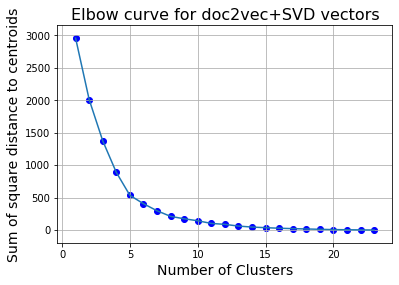

In [693]:
KMEANS(doc_svd_300, 'doc2vec+SVD') 

In [696]:
kmeans = KMeans(n_clusters=7)
kmeans.fit(doc_svd_300)
labels = kmeans.predict(doc_svd_300)

In [697]:
labels

array([4, 1, 3, 3, 0, 1, 2, 3, 1, 1, 3, 6, 6, 1, 1, 1, 1, 1, 1, 6, 2, 5,
       2, 1])

In [698]:
doc_svd_300

array([[ 89.764015  ,  19.978746  ,   6.9917526 ],
       [ 76.136246  ,   1.2677196 ,   3.2315483 ],
       [ 79.5232    , -12.192881  ,  -2.912871  ],
       [ 79.64193   ,  -4.5014052 ,  -3.2691302 ],
       [ 86.8149    ,  -1.3359234 ,   7.745773  ],
       [ 71.172226  ,   3.0002816 ,   2.0030568 ],
       [ 87.084435  ,   1.558903  ,  -9.951071  ],
       [ 81.80173   ,  -6.1606154 ,  -1.2429514 ],
       [ 79.01044   ,   1.1074796 ,   3.2196982 ],
       [ 72.651276  ,   3.1900873 ,   3.6311173 ],
       [ 80.00947   ,  -5.27719   ,  -1.2426445 ],
       [ 82.90614   ,   2.0666866 ,  -8.240399  ],
       [ 82.5913    ,   1.6587675 ,  -4.2403126 ],
       [ 76.07638   ,   4.1131277 ,  -0.6298071 ],
       [ 73.20042   ,  -2.4940789 ,   5.0663834 ],
       [ 68.05947   ,   0.37785298,   4.205643  ],
       [ 76.64819   ,   2.8954866 ,   2.3887892 ],
       [ 73.85773   ,   0.41752002,   2.1258821 ],
       [ 75.24453   ,  -2.7771554 ,   1.3969051 ],
       [ 80.97251   ,   6.13498

In [699]:
labels

array([4, 1, 3, 3, 0, 1, 2, 3, 1, 1, 3, 6, 6, 1, 1, 1, 1, 1, 1, 6, 2, 5,
       2, 1])

Ploting..


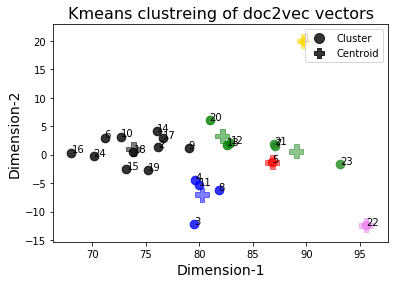

<Figure size 432x288 with 0 Axes>

In [700]:
# 4 dimension
print ("Ploting..")
color=['r','k','forestgreen','b','gold', 'violet', 'g']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']
centers = kmeans.cluster_centers_

#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_svd_300)):
    x = doc_svd_300[:,0][i]
    y = doc_svd_300[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)
cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')

plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1', fontsize = 14)
ax.set_ylabel('Dimension-2', fontsize = 14)
plt.title('Kmeans clustreing of doc2vec vectors', fontsize = 16)
plt.show()
plt.savefig('Kmeans_SVD_doc2vec')

In [384]:
doc_svd_stem = svd(doc_vec_stem,3)


In [684]:
kmeans = KMeans(n_clusters=7)
kmeans.fit(doc_svd_stem)
labels = kmeans.predict(doc_svd_stem)
labels

array([4, 5, 2, 2, 1, 5, 6, 2, 1, 5, 2, 0, 0, 5, 5, 5, 5, 5, 5, 0, 6, 3,
       6, 5])

Ploting..


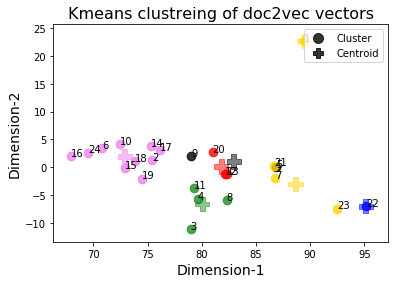

<Figure size 432x288 with 0 Axes>

In [685]:
print ("Ploting..")
color=['r','k','forestgreen','b','gold', 'violet','gold']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


centers = kmeans.cluster_centers_

#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_svd_stem)):
    x = doc_svd_stem[:,0][i]
    y = doc_svd_stem[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)
cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')

plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1', fontsize = 14)
ax.set_ylabel('Dimension-2', fontsize = 14)
plt.title('Kmeans clustreing of doc2vec vectors', fontsize = 16)
plt.show()
plt.savefig('Kmeans_SVD_doc2vec')

In [391]:
pca = PCA(n_components=2)

#將資料轉成兩個主成份
pca.fit(doc_vec_stem)
doc_pca_stem = pca.transform(doc_vec_stem)

In [392]:
kmeans = KMeans(n_clusters=8)
kmeans.fit(doc_pca_stem)
labels = kmeans.predict(doc_pca_stem)

In [393]:
labels

array([3, 7, 0, 5, 2, 6, 2, 5, 7, 1, 5, 2, 2, 7, 1, 6, 7, 1, 1, 7, 2, 4,
       4, 6])

Ploting..


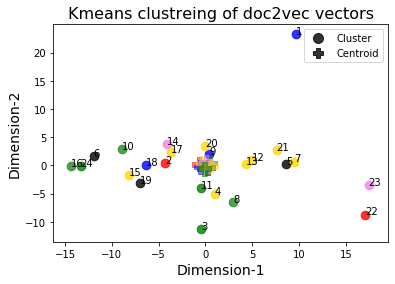

<Figure size 432x288 with 0 Axes>

In [767]:
print ("Ploting..")
color=['r','k','forestgreen','b','gold', 'violet','gold', 'g']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


centers = kmeans.cluster_centers_

#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_pca_stem)):
    x = doc_pca_stem[:,0][i]
    y = doc_pca_stem[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)
cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')

plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1', fontsize = 14)
ax.set_ylabel('Dimension-2', fontsize = 14)
plt.title('Kmeans clustreing of doc2vec vectors', fontsize = 16)
plt.show()
plt.savefig('Kmeans_SVD_doc2vec')

#### Test with doc2vec + cosine similarity + MDS

In [802]:
doc_mds_cosine = mds(doc_vec_cosine,2)

In [803]:
kmeans = KMeans(n_clusters=6)
kmeans.fit(doc_mds_cosine)
labels = kmeans.predict(doc_mds_cosine)

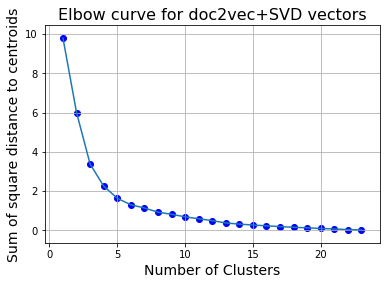

In [804]:
KMEANS(doc_mds_cosine, 'doc2vec+SVD') 

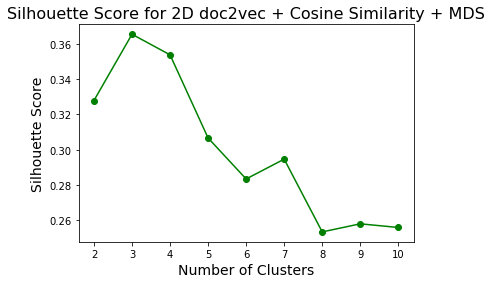

In [805]:
silhouette_avg = []
for i in range(2,11):
    kmeans_fit = KMeans(n_clusters = i).fit(doc_mds_cosine)
    silhouette_avg.append(silhouette_score(doc_mds_cosine, kmeans_fit.labels_))
plt.plot(range(2,11), silhouette_avg, color = 'g', marker = 'o')

plt.xlabel('Number of Clusters', fontsize = 14)
plt.ylabel('Silhouette Score', fontsize = 14)
plt.title('Silhouette Score for 2D doc2vec + Cosine Similarity + MDS', fontsize = 16)

plt.savefig('Silhouette Score_doc2vec_SVD')

Ploting..


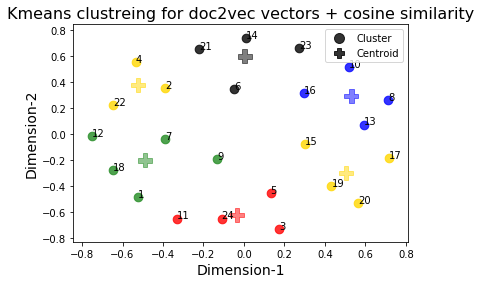

In [806]:
print ("Ploting..")
color=['r','k','forestgreen','b','gold', 'gold']
#color=['r','g','b','m']
marker=['x','o','^','v',',','p','+','<','>']


centers = kmeans.cluster_centers_

#2 dim plot
fig, ax = plt.subplots()
for i in range(0, len(doc_mds_cosine)):
    x = doc_mds_cosine[:,0][i]
    y = doc_mds_cosine[:,1][i]
    c = color[labels[i]]
    m = marker[labels[i]]  
    ax.scatter(x,y,c=c,marker='o',alpha=0.8,s=75)
    ax.annotate(i+1, (x,y), fontsize=10)
ax.scatter(centers[:, 0], centers[:, 1], c=color,marker='P', s=200, alpha=0.5)
cir = mlines.Line2D([], [], color='k',alpha=0.8, marker='o', linestyle='None',
                          markersize=10, label='Cluster')
cross = mlines.Line2D([], [], color='k',alpha=0.8, marker='P', linestyle='None',
                          markersize=10, label='Centroid')

plt.legend(handles=[cir, cross])

ax.set_xlabel('Dimension-1', fontsize = 14)
ax.set_ylabel('Dimension-2', fontsize = 14)
plt.title('Kmeans clustreing for doc2vec vectors + cosine similarity', fontsize = 16)
plt.show()

### PCA Reference:
http://psop-blog.logdown.com/posts/3161978-python-machine-learning-principle-component-analysis

### Kmeans reference:
Kmenas library: https://ithelp.ithome.com.tw/articles/10207518
Silhouette Score: https://medium.com/@jimmy_huang/kmeans%E5%88%86%E7%BE%A4%E6%BC%94%E7%AE%97%E6%B3%95-%E8%88%87-silhouette-%E8%BC%AA%E5%BB%93%E5%88%86%E6%9E%90-8be17e634589

In [21]:
def KMEANS(featureVectors, model):  
    sum_of_distance = []  

    for i in range(1,24):
        kmeans = KMeans(n_clusters = i)
        kmeans.fit(featureVectors)
        sum_of_distance.append(kmeans.inertia_)

    fig = plt.figure()
    plt.plot(range(1, 24), sum_of_distance)
    plt.scatter(range(1, 24), sum_of_distance, color='b',marker='o')
    plt.grid(True)
    plt.xlabel('Number of Clusters', fontsize = 14)
    plt.ylabel('Sum of square distance to centroids', fontsize = 14)
    plt.title('Elbow curve for {} vectors'.format(model), fontsize = 16)
    plt.savefig('kmeans clustering of {}'.format(model))

### Use TaggedDocument to give each sentence a identification number

In [36]:
data = [['I', 'love', 'Jesus'],['How','great','is','our','God'],['Break','the','chain']]

In [37]:
test =  [TaggedDocument(words=_d, tags=[str(i)]) for i, _d in enumerate(data)]

In [466]:
test

[TaggedDocument(words=['I', 'love', 'Jesus'], tags=['0']),
 TaggedDocument(words=['How', 'great', 'is', 'our', 'God'], tags=['1']),
 TaggedDocument(words=['Break', 'the', 'chain'], tags=['2'])]

In [459]:
data = ["I love machine learning. Its awesome.",
        "I love coding in python",
        "I love building chatbots",
        "they chat amagingly well"]

tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]

In [460]:
tagged_data 

[TaggedDocument(words=['i', 'love', 'machine', 'learning', '.', 'its', 'awesome', '.'], tags=['0']),
 TaggedDocument(words=['i', 'love', 'coding', 'in', 'python'], tags=['1']),
 TaggedDocument(words=['i', 'love', 'building', 'chatbots'], tags=['2']),
 TaggedDocument(words=['they', 'chat', 'amagingly', 'well'], tags=['3'])]

In [462]:
len(tagged_data )

4

In [25]:
#Import all the dependencies
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

data = ["I love machine learning. Its awesome.",
        "I love coding in python",
        "I love building chatbots",
        "they chat amagingly well"]

tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(data)]

In [26]:
tagged_data

[TaggedDocument(words=['i', 'love', 'machine', 'learning', '.', 'its', 'awesome', '.'], tags=['0']),
 TaggedDocument(words=['i', 'love', 'coding', 'in', 'python'], tags=['1']),
 TaggedDocument(words=['i', 'love', 'building', 'chatbots'], tags=['2']),
 TaggedDocument(words=['they', 'chat', 'amagingly', 'well'], tags=['3'])]

### Feature Extraction using gensim doc2vec

#### Doc2vec tutorial : https://medium.com/@mishra.thedeepak/doc2vec-simple-implementation-example-df2afbbfbad5

In [27]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

def doc2vec(doc, vec_size=400, max_epoch=100, alpha=0.025):
    ## prepare doc2vec input - list of taggedDocument
    tagged_doc = []
    for index, text in enumerate(doc):
        tagged_doc.append(TaggedDocument(words=text, tags=[str(index)]))
    # the document has been tokenized, no need to preprocess again

    # setup configurations
    model = Doc2Vec(size=vec_size,
                    alpha=alpha, 
                    min_alpha=0.00025,
                    min_count=1,
                    dm =1)
    model.build_vocab(tagged_doc)

    # Train the model
    print("Training doc2vec model..")
    for epoch in range(max_epoch):
        #print('iteration {0}'.format(epoch))
        model.train(tagged_doc, total_examples=model.corpus_count, epochs=model.iter )
        # Change learning rate for next epoch (start with large num to speed up 
        # at first and then decrease to fine grain learning)

        # decrease the learning rate
        model.alpha -= 0.0002
        # fix the learning rate, no decay
        model.min_alpha = model.alpha

    model.save("d2v.model")
    print("Done training..")
    return model

def doc2vec_to_vectors(model): 
    # Extract vectors from doc2vec model
    feature_vectors = []
    for i in range(0,len(model.docvecs)) :
        feature_vectors.append(model.docvecs[i])
    
    return feature_vectors    

### Perform doc2vec to data processing without lemmatization

In [3]:
bookFeatures = load('books.pkl')

NameError: name 'load' is not defined

In [729]:
def ward_cluster(n, bookFeatures, model):
    #parameter setting
    #Agglomerative Clustering method
    model = AgglomerativeClustering(n_clusters = n, linkage = 'ward')


    model.fit(bookFeatures)
    labels = model.fit_predict(bookFeatures)
    print(labels)


    #results visualization
    plt.figure()
    plt.scatter(bookFeatures[:,0], bookFeatures[:,1], c = labels)
    plt.axis('equal')
    plt.title('Hierarchical Clustering(Ward) for {} features'.format(model))
    plt.show()
    plt.savefig('Ward clustering _{}'.format(model))
    

    # Performs hierarchical/agglomerative clustering on X by using "Ward's method"
    
    linkage_matrix = linkage(bookFeatures, 'ward')
    figure = plt.figure(figsize=(7.5, 5))
    # Plots the dendrogram
    dendrogram(linkage_matrix, labels = labels)
    plt.title('Hierarchical Clustering Dendrogram (Ward) for {} features'.format(model) )
    plt.xlabel('cluster index')
    plt.ylabel('distance')
    plt.tight_layout()
    plt.show()
    plt.savefig('Hierarchical Clustering Dendrogram (Ward)')

In [79]:
mds = MDS(n_components=2, random_state=1,dissimilarity="precomputed", metric=True)

In [267]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np

%matplotlib inline
np.set_printoptions(precision=5, suppress=True)

REFERENCE OF HIERACHICAL CLUSTERING:https://haojunsui.github.io/2016/07/16/scipy-hac/

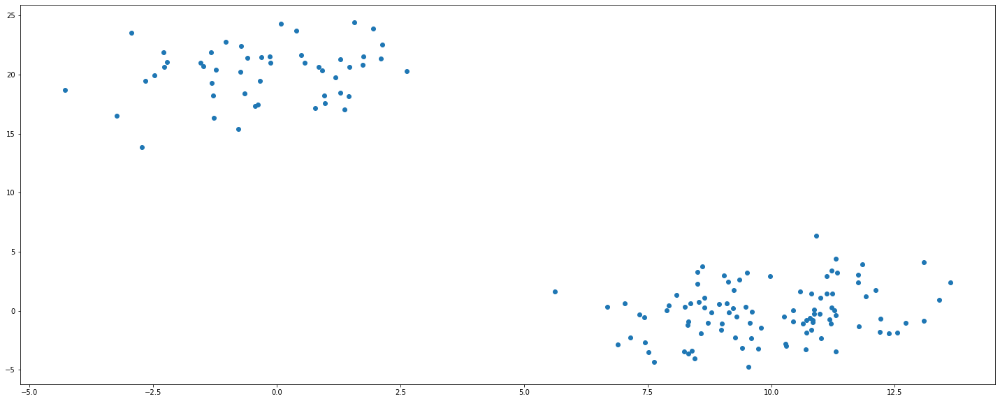

In [268]:
# 生成两个集群: 集群 a 有100个数据点, 集群 b 有50个数据点:
np.random.seed(1029)
a = np.random.multivariate_normal([10, 0], [[3, 1], [1, 4]], size=[100,])
b = np.random.multivariate_normal([0, 20], [[3, 1], [1, 4]], size=[50,])
X = np.concatenate((a, b),)
plt.figure(figsize=(25, 10))
plt.scatter(X[:, 0], X[:, 1])
plt.show()

In [269]:
Z = linkage(X, 'ward')

In [701]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist


### Hierachical clustering using TF-IDF vectors

In [702]:
tdidf_ward = linkage(tf_mds_lemma, 'ward')
tdidf_single = linkage(tf_mds_lemma, 'single')
tdidf_average = linkage(tf_mds_lemma, 'average')
tdidf_complete = linkage(tf_mds_lemma, 'complete')

### Hierachical clustering using doc2vec vectors

In [346]:
doc2vec_ward = linkage(doc_pca_stem, 'ward')
doc2vec_single = linkage(doc_pca_stem, 'single')
doc2vec_average = linkage(doc_pca_stem, 'average')
doc2vec_complete = linkage(doc_pca_stem, 'complete')

In [347]:
doc2vec_ward = linkage(doc_vec, 'ward')
doc2vec_single = linkage(doc_vec, 'single')
doc2vec_average = linkage(doc_vec, 'average')
doc2vec_complete = linkage(doc_vec, 'complete')

In [348]:
a, coph_dists_ward = cophenet(doc2vec_ward, pdist(doc_vec))
b, coph_dists_single = cophenet(doc2vec_single, pdist(doc_vec))
c, coph_dists_average = cophenet(doc2vec_average, pdist(doc_vec))
d, coph_dists_complete = cophenet(doc2vec_complete, pdist(doc_vec))

print(a)
print(b)
print(c)
print(d)

0.6969234644367832
0.8288764540198587
0.8714657068639653
0.7656929634422422


In [351]:
doc_svd_300

array([[ 89.764015  ,  19.978746  ,   6.9917526 ],
       [ 76.136246  ,   1.2677196 ,   3.2315483 ],
       [ 79.5232    , -12.192881  ,  -2.912871  ],
       [ 79.64193   ,  -4.5014052 ,  -3.2691302 ],
       [ 86.8149    ,  -1.3359234 ,   7.745773  ],
       [ 71.172226  ,   3.0002816 ,   2.0030568 ],
       [ 87.084435  ,   1.558903  ,  -9.951071  ],
       [ 81.80173   ,  -6.1606154 ,  -1.2429514 ],
       [ 79.01044   ,   1.1074796 ,   3.2196982 ],
       [ 72.651276  ,   3.1900873 ,   3.6311173 ],
       [ 80.00947   ,  -5.27719   ,  -1.2426445 ],
       [ 82.90614   ,   2.0666866 ,  -8.240399  ],
       [ 82.5913    ,   1.6587675 ,  -4.2403126 ],
       [ 76.07638   ,   4.1131277 ,  -0.6298071 ],
       [ 73.20042   ,  -2.4940789 ,   5.0663834 ],
       [ 68.05947   ,   0.37785298,   4.205643  ],
       [ 76.64819   ,   2.8954866 ,   2.3887892 ],
       [ 73.85773   ,   0.41752002,   2.1258821 ],
       [ 75.24453   ,  -2.7771554 ,   1.3969051 ],
       [ 80.97251   ,   6.13498

In [709]:
doc2vec_ward = linkage(doc_svd_300, 'ward')
doc2vec_single = linkage(doc_svd_300, 'single')
doc2vec_average = linkage(doc_svd_300, 'average')
doc2vec_complete = linkage(doc_svd_300, 'complete')

In [710]:
a, coph_dists_ward = cophenet(doc2vec_ward, pdist(doc_svd_300))
b, coph_dists_single = cophenet(doc2vec_single, pdist(doc_svd_300))
c, coph_dists_average = cophenet(doc2vec_average, pdist(doc_svd_300))
d, coph_dists_complete = cophenet(doc2vec_complete, pdist(doc_svd_300))

print(a)
print(b)
print(c)
print(d)

0.6282048928032973
0.7831291417967038
0.8637955520269234
0.7427429527127071


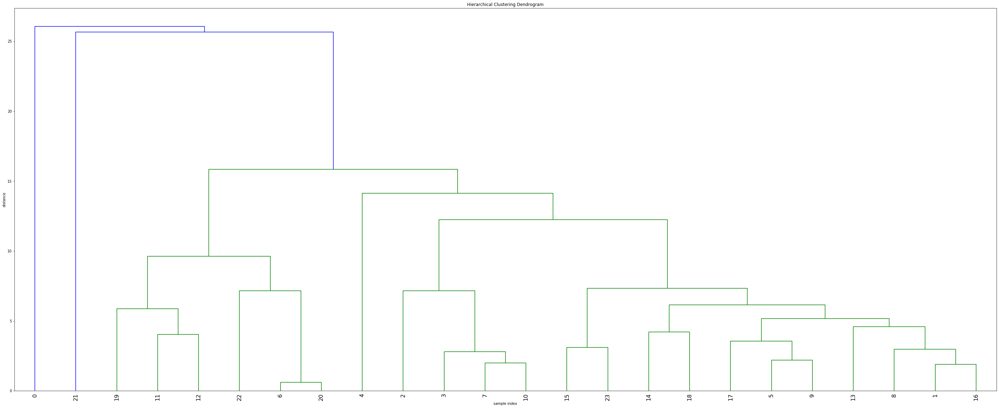

In [711]:
plt.figure(figsize=(50, 20))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(doc2vec_average, leaf_rotation=90., leaf_font_size=16.)
plt.show()

### 建立樹狀圖

### 縮減樹狀圖

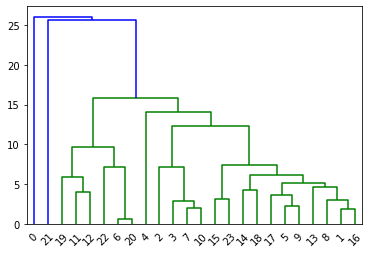

In [754]:
ddata = dendrogram(doc2vec_average)


In [787]:
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (Average)', fontsize=16)
        plt.xlabel('Index of books', fontsize=14)
        plt.ylabel('Distance', fontsize=14)
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5), textcoords='offset points', va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

### 選擇臨界距離決定集群數量

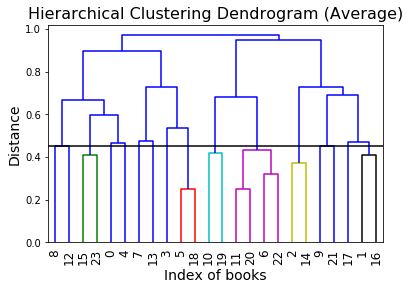

In [788]:
### TF-IDF
max_d = 0.45
fancy_dendrogram(tdidf_average, truncate_mode='lastp', leaf_rotation=90., leaf_font_size=12., show_contracted=True, annotate_above=10, max_d=max_d)
plt.show()

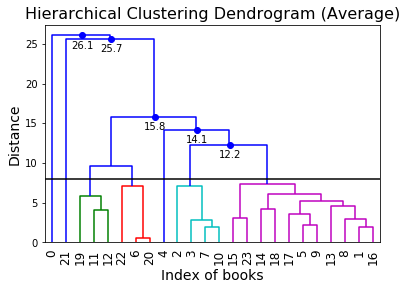

In [744]:
# DOC2VEC
max_d = 8

fancy_dendrogram(doc2vec_average, truncate_mode='lastp', leaf_rotation=90., leaf_font_size=12., show_contracted=True, annotate_above=10, max_d=max_d)
plt.show()

### 已知群集數量

In [717]:
# TF-IDF
k = 6
cluster_tfidf = fcluster(tdidf_average, k, criterion='maxclust')
cluster_tfidf

array([1, 6, 5, 3, 1, 3, 4, 2, 1, 6, 4, 4, 1, 2, 5, 1, 6, 6, 3, 4, 4, 6,
       4, 1], dtype=int32)

In [718]:
# DOC2VEC
k = 6
cluster_d2v = fcluster(doc2vec_average, k, criterion='maxclust')
cluster_d2v

array([6, 3, 2, 2, 4, 3, 1, 2, 3, 3, 2, 1, 1, 3, 3, 3, 3, 3, 3, 1, 1, 5,
       1, 3], dtype=int32)

In [719]:
result_tfidf = {}
for book_index, cluster_no in enumerate(cluster_tfidf):
    if cluster_no not in result_tfidf:
        result_tfidf[cluster_no] = [book_index+1]
        continue
    result_tfidf[cluster_no].append(book_index+1)

In [720]:
result_d2v = {}
for book_index, cluster_no in enumerate(cluster_d2v):
    if cluster_no not in result_d2v:
        result_d2v[cluster_no] = [book_index+1]
        continue
    result_d2v[cluster_no].append(book_index+1)

In [721]:
result_tfidf

{1: [1, 5, 9, 13, 16, 24],
 6: [2, 10, 17, 18, 22],
 5: [3, 15],
 3: [4, 6, 19],
 4: [7, 11, 12, 20, 21, 23],
 2: [8, 14]}

In [722]:
result_d2v

{6: [1],
 3: [2, 6, 9, 10, 14, 15, 16, 17, 18, 19, 24],
 2: [3, 4, 8, 11],
 4: [5],
 1: [7, 12, 13, 20, 21, 23],
 5: [22]}

### Hierachical Clustering Tutorial

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn import datasets
#create datasets
X,y = datasets.make_blobs(n_samples=50, centers=3, n_features=2, random_state= 20, cluster_std = 1.5)

#parameter setting
n = 3 #number of clusters (not essential)

#Agglomerative Clustering method
model = AgglomerativeClustering(n_clusters = n, linkage = 'ward')
#linkage: ['ward', 'complete', 'average']
model.fit(bookFeatures)
labels = model.fit_predict(bookFeatures)

#results visualization
plt.figure()
plt.scatter(bookFeatures[:,0], X[:,1], c = labels)
plt.axis('equal')
plt.title('Prediction')
plt.show()

NameError: name 'bookFeatures' is not defined

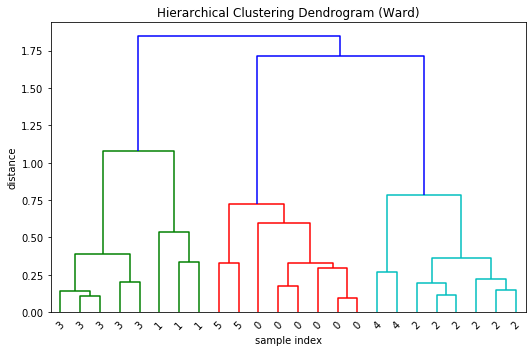

In [682]:
from scipy.cluster.hierarchy import dendrogram, linkage
# Performs hierarchical/agglomerative clustering on X by using "Ward's method"
linkage_matrix = linkage(bookFeatures, 'ward')
figure = plt.figure(figsize=(7.5, 5))
# Plots the dendrogram
dendrogram(linkage_matrix, labels = labels)
plt.title('Hierarchical Clustering Dendrogram (Ward)')
plt.xlabel('sample index')
plt.ylabel('distance')
plt.tight_layout()
plt.show()

0.9694977796588033
0.9316498188865665
0.903321468315039


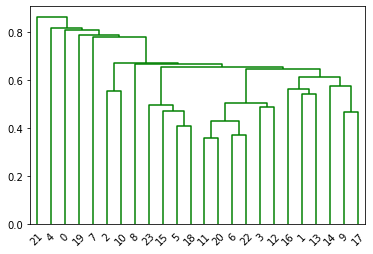

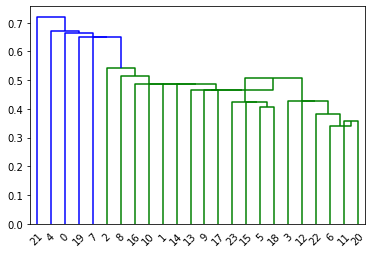

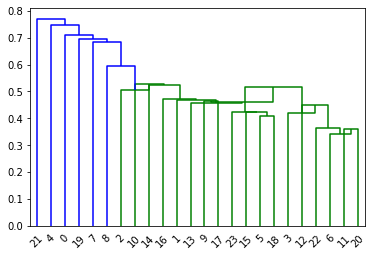

In [523]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import fcluster
X = [[i] for i in [2, 8, 0, 4, 1, 9, 9, 0]]

Z = linkage(bookFeatures, 'average')
fig = plt.figure()
dn = dendrogram(Z, color_threshold = 21)
c, coph_dists = cophenet(Z, pdist(bookFeatures))
print(c)


Z = linkage(bookFeatures, 'centroid')
fig = plt.figure()
dn = dendrogram(Z, color_threshold = 0.6)
c, coph_dists = cophenet(Z, pdist(bookFeatures))
print(c)


Z = linkage(bookFeatures, 'median')
fig = plt.figure()
dn = dendrogram(Z)
c, coph_dists = cophenet(Z, pdist(bookFeatures))
print(c)


0.5501910619935879


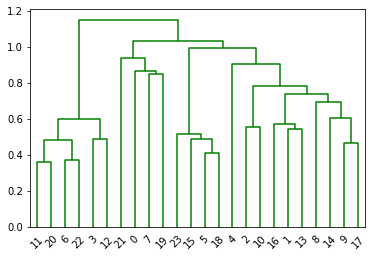

In [537]:
Z = linkage(bookFeatures, 'ward')
fig = plt.figure()
dn = dendrogram(Z, color_threshold = 21)
c, coph_dists = cophenet(Z, pdist(bookFeatures))
print(c)